Training custom models for segmentation using StarDist

In [1]:
!pip install stardist
!pip install Pillow


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 27.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 9.5 MB/s eta 0:00:00


In [3]:
#Random color map labels
np.random.seed(42)
lbl_cmap = random_label_cmap()

In [2]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
from keras.optimizers import Adam
from keras.callbacks import LearningRateScheduler
from stardist.models import StarDist2D
from stardist import random_label_cmap, Rays_GoldenSpiral
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
# Set the interpolation method to 'nearest'
plt.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
import base64
from glob import glob
import xml.etree.ElementTree as ET
from PIL import Image
from io import BytesIO
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize
import cv2
from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from stardist.matching import matching, matching_dataset
from stardist.models import Config2D, StarDist2D, StarDistData2D

In [5]:
from PIL import Image, ImageDraw
from shapely.geometry import Polygon

def create_masks_from_xml(xml_file, image_size):
    # Parse the XML file
    tree = ET.parse(xml_file)
    root = tree.getroot()
    # print(root)
    mask = Image.new('L' , (image_size[1],image_size[0]), 0)
    for class_of_cells in root.findall('.//Annotation'):
        # print(class_of_cells)

        for region_of_cells in class_of_cells.findall('.//Regions'):
            # print(region_of_cells)

            for set_of_vertices in region_of_cells.findall('.//Vertices'):
                # print(set_of_vertices)


                # Get object name (class label) and polygon points
                # class_name = object_elem.find('name').text


                # polygon_elem = set_of_vertices.find('Vertex')

                # Extract polygon points as a list of (x, y) tuples
                polygon_points=[]
                for point in set_of_vertices.findall('Vertex'):
                    polygon_points.append((int(point.attrib['X']), int(point.attrib['Y'])))
                    # print(polygon_points)


                # polygon_points = [(int(point.find('X').text), int(point.find('Y').text))
                #                 for point in set_of_vertices.findall('Vertex')]

                # Load the corresponding image


                # image_filename = os.path.join(image_folder, root.find('filename').text)
                # image = Image.open(image_filename)


                # Create a mask image
                # mask = Image.new('L', image.size, 0)

                draw = ImageDraw.Draw(mask)

                # Convert polygon points to a Shapely Polygon
                polygon = Polygon(polygon_points)

                # Create a list of coordinates for drawing the polygon
                polygon_coordinates = [coord for point in polygon.exterior.coords for coord in point]

                # Fill the polygon with white color
                draw.polygon(polygon_coordinates, fill=255)

                # Save the mask image
                # mask_filename = os.path.join(output_folder, f"{class_name}_mask.png")
                # mask.save(mask_filename)
    opencv_image = np.array(mask)
    # opencv_image = cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2BGR)
    # cv2.imshow("Mask image" , opencv_image)
    # cv2.waitKey(0)
    return opencv_image

                # mask.show()

In [6]:
from urllib.request import proxy_bypass
#Read input image and corresponding mask names
# X = sorted(glob('/content/drive/MyDrive/Colab Notebooks/data/mito_dataset_256x256/mito_images/*.tif'))
# Y = sorted(glob('/content/drive/MyDrive/Colab Notebooks/data/mito_dataset_256x256/mito_masks/*.tif'))


import cv2
base_folder = '/content/drive/MyDrive/MoNuSAC_images_and_annotations/MoNuSAC_images_and_annotations'

images = []
masks = []

# Loop through all subfolders and find image-mask pairs
for root, dirs, files in os.walk(base_folder):
    #print(dirs)
    for f in dirs:

        path_of_sub_folder = "/content/drive/MyDrive/MoNuSAC_images_and_annotations/MoNuSAC_images_and_annotations/"+str(f)

        for root, dirs, files in os.walk(path_of_sub_folder):

            for file in files:

              if file.endswith('.xml'):
                  # Construct the full path to the file
                  # file_path = os.path.join(root, file)

                  corresponding_image_path = str(file)[:-4]+".tif"
                  corresponding_image = cv2.imread(os.path.join(root, corresponding_image_path))

                  image_mask = create_masks_from_xml(os.path.join(root, file), corresponding_image.shape)

                  masks.append(image_mask)
                  images.append(corresponding_image)


X = np.array(images)


Y = np.array(masks)

<ipython-input-6-64cd62335e99> (37): Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
<ipython-input-6-64cd62335e99> (40): Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
#Normalize input images and fill holes in masks
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
#if n_channel > 1:
    #print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    #sys.stdout.flush()

try:
    X = [normalize(x, 1, 99.8, axis=axis_norm) for x in tqdm(X)]
except Exception as e:
    print("Error normalizing input images:", str(e))

try:
    Y = [fill_label_holes(y) for y in tqdm(Y)]
except Exception as e:
    print("Error filling label holes in masks:", str(e))


100%|██████████| 209/209 [00:06<00:00, 33.75it/s]


In [8]:
#Split to train and val
#You can use any method to split. I am following the method used in StarDist documentation example
#assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train]
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

number of images: 209
- training:       178
- validation:      31


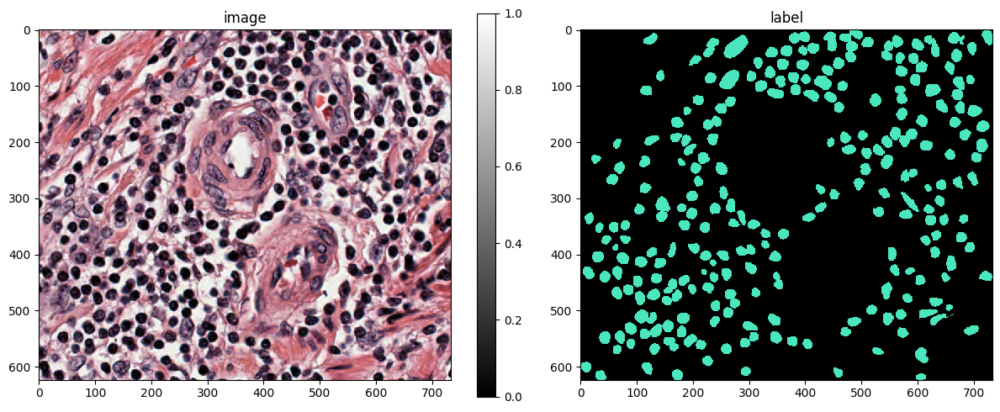

In [9]:
#PLot image and label for some images - sanity check
def plot_img_label(img, lbl, img_title="image", lbl_title="label", **kwargs):
    fig, (ai,al) = plt.subplots(1,2, figsize=(12,5), gridspec_kw=dict(width_ratios=(1.25,1)))
    im = ai.imshow(img, cmap='gray', clim=(0,1))
    ai.set_title(img_title)
    fig.colorbar(im, ax=ai)
    al.imshow(lbl, cmap=lbl_cmap)
    al.set_title(lbl_title)
    plt.tight_layout()


i = min(9, len(X)-1)

img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if (img.ndim==2 or img.shape[-1]==3) else img[...,0]
plot_img_label(img,lbl)


In [10]:
#Check config to get an idea about all parameters
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class predection (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
   

In [11]:
#Define the config by setting some parameter values

# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32  #Number of radial directions for the star-convex polygon.

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel,
)
print(conf)
vars(conf)

Config2D(n_dim=2, axes='YXC', n_channel_in=3, n_channel_out=33, train_checkpoint='weights_best.h5', train_checkpoint_last='weights_last.h5', train_checkpoint_epoch='weights_now.h5', n_rays=32, grid=(2, 2), backbone='unet', n_classes=None, unet_n_depth=3, unet_kernel_size=(3, 3), unet_n_filter_base=32, unet_n_conv_per_depth=2, unet_pool=(2, 2), unet_activation='relu', unet_last_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_prefix='', net_conv_after_unet=128, net_input_shape=(None, None, 3), net_mask_shape=(None, None, 1), train_shape_completion=False, train_completion_crop=32, train_patch_size=(256, 256), train_background_reg=0.0001, train_foreground_only=0.9, train_sample_cache=True, train_dist_loss='mae', train_loss_weights=(1, 0.2), train_class_weights=(1, 1), train_epochs=400, train_steps_per_epoch=100, train_learning_rate=0.0003, train_batch_size=4, train_n_val_patches=None, train_tensorboard=True, train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 3,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 3),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,


In [12]:
if use_gpu:
    from csbdeep.utils.tf import limit_gpu_memory
    # adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
    limit_gpu_memory(0.8)
    # alternatively, try this:
    # limit_gpu_memory(None, allow_growth=True)

In [13]:
#Save model to the specified directory
model = StarDist2D(conf, name='stardist_tutorial', basedir='/content/drive/MyDrive/Colab Notebooks/models')

base_model.py (149): output path for model already exists, files may be overwritten: /content/drive/MyDrive/Colab Notebooks/models/stardist_tutorial


Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.751123, nms_thresh=0.3.


In [14]:
#Define the network field of view to size larger than the median object size
median_size = calculate_extents(list(Y), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
print(f"median object size:      {median_size}")
print(f"network field of view :  {fov}")
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")


median object size:      [468. 509.]
network field of view :  [94 94]


In [15]:
#Define a few augmentation methods
def random_fliprot(img, mask):
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim)))
    mask = mask.transpose(perm)
    for ax in axes:
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):
    """Augmentation of a single input/label image pair.
    x is an input image
    y is the corresponding ground-truth label image
    """
    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y


    # Random resizing by +/- 10%
    scale_factor = np.random.uniform(0.9, 1.1)
    x = cv2.resize(x, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_LINEAR)
    y = cv2.resize(y, None, fx=scale_factor, fy=scale_factor, interpolation=cv2.INTER_NEAREST)

    # Random shearing
    shear_angle = np.random.uniform(-5, 5)  # Adjust the range as needed
    shear_matrix = skimage_transform.AffineTransform(shear=np.deg2rad(shear_angle))
    x = skimage_transform.warp(x, shear_matrix, mode='reflect')
    y = skimage_transform.warp(y, shear_matrix, mode='reflect', order=0)

    # Random rotation (not just 90 degrees)
    angle = np.random.uniform(0, 360)  # Adjust the range as needed
    x = skimage_transform.rotate(x, angle, mode='reflect')
    y = skimage_transform.rotate(y, angle, mode='reflect', order=0)

    # Add Gaussian noise only to images
    sig = 0.02 * np.random.uniform(0, 1)
    x = x + sig * np.random.normal(0, 1, x.shape)

    return x, y

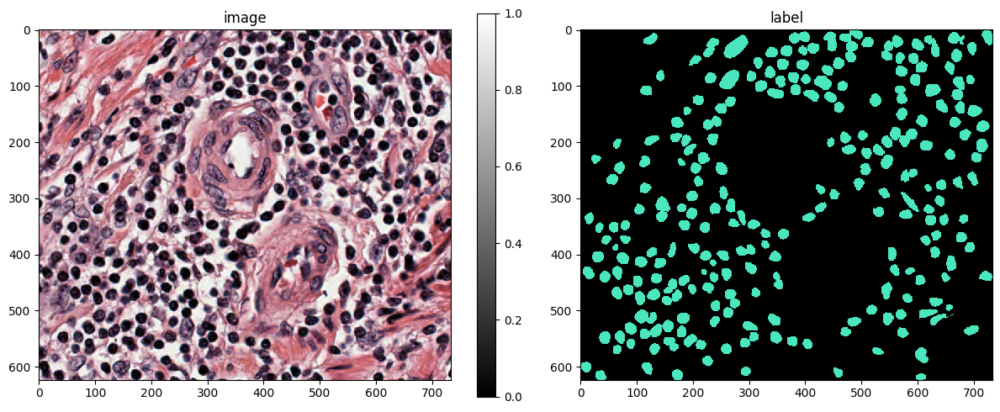

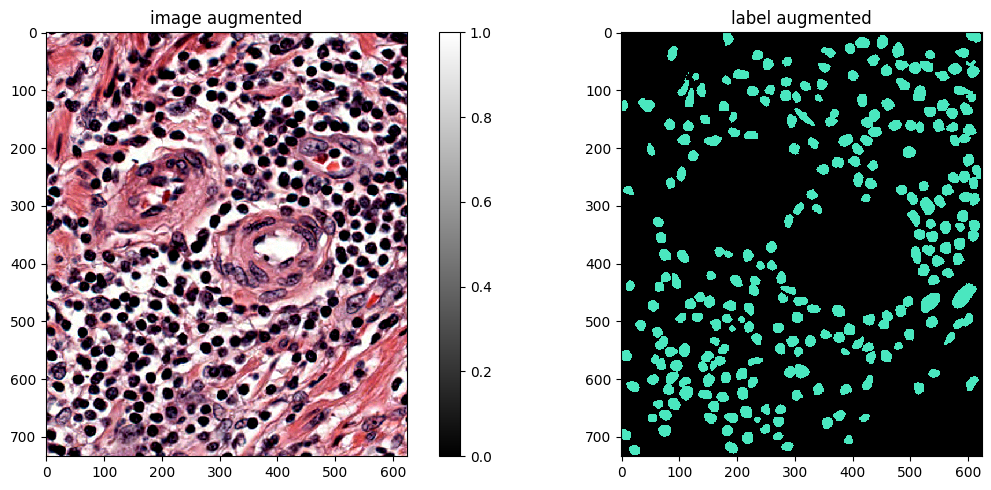

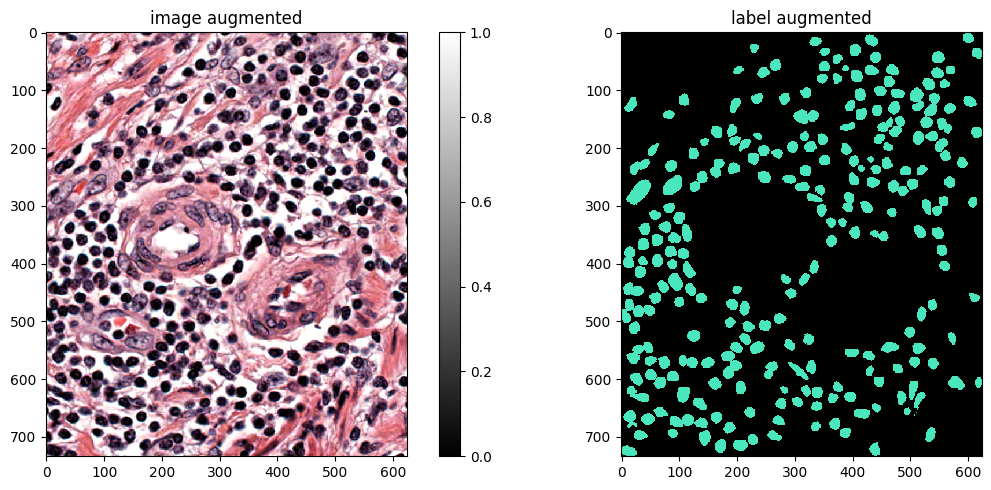

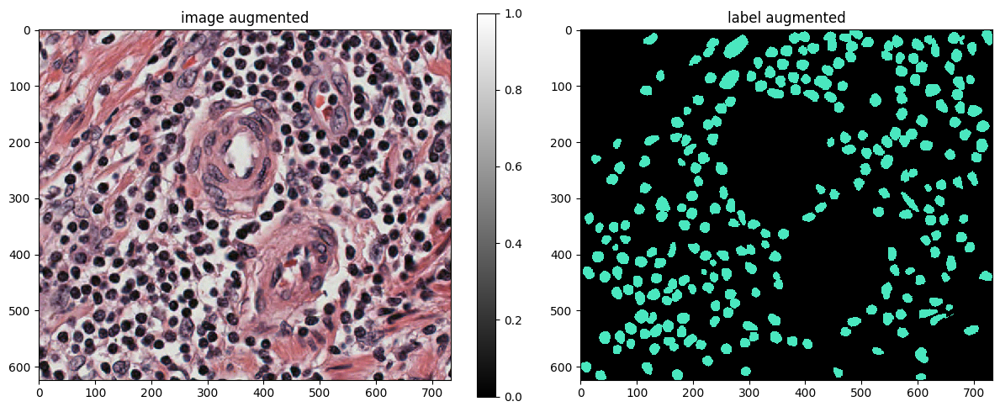

In [19]:
# plot some augmented examples
img, lbl = X[9],Y[9]
plot_img_label(img, lbl)
for _ in range(3):
    img_aug, lbl_aug = augmenter(img,lbl)

    plot_img_label(img_aug, lbl_aug, img_title="image augmented", lbl_title="label augmented")


In [16]:
""" X_trn_image_size = []
Y_trn_image_size = []
X_val_image_size = []
Y_val_image_size = []

# Assuming you want to find the shape of each image
for image in X_trn:
    X_trn_image_size.append(image.shape)

for image in Y_trn:
    Y_trn_image_size.append(image.shape)

for image in X_val:
    X_val_image_size.append(image.shape)

for image in Y_val:
    Y_val_image_size.append(image.shape)


# Define the desired patch size

desired_size = (256, 256)

# Check and resize training images if needed
if any(dim < size for image in X_trn for dim, size in zip(image.shape[:2], desired_size)):
    resized_X_trn = [cv2.resize(image, desired_size) for image in X_trn]
    X_trn_resized = np.array(resized_X_trn)
else:
    X_trn_resized = X_trn

if any(dim < size for image in Y_trn for dim, size in zip(image.shape[:2], desired_size)):
    resized_Y_trn = [cv2.resize(image, desired_size) for image in Y_trn]
    Y_trn_resized = np.array(resized_Y_trn)
else:
    Y_trn_resized = Y_trn

# Check and resize validation images if needed
if any(dim < size for image in X_val for dim, size in zip(image.shape[:2], desired_size)):
    resized_X_val = [cv2.resize(image, desired_size) for image in X_val]
    X_val_resized = np.array(resized_X_val)
else:
    X_val_resized = X_val

if any(dim < size for image in Y_val for dim, size in zip(image.shape[:2], desired_size)):
    resized_Y_val = [cv2.resize(image, desired_size) for image in Y_val]
    Y_val_resized = np.array(resized_Y_val)
else:
    Y_val_resized = Y_val

"""
# Check and pad training images if needed
from google.colab.patches import cv2_imshow
desired_size = (256, 256)
padded_X_trn = []
for image in X_trn:
    h, w, _ = image.shape
    if h < desired_size[0] or w < desired_size[1]:
        pad_h = max(0, desired_size[0] - h)
        pad_w = max(0, desired_size[1] - w)
        top_pad = pad_h // 2
        bottom_pad = pad_h - top_pad
        left_pad = pad_w // 2
        right_pad = pad_w - left_pad
        # Pad with three channels instead of one (convert to color)
        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))
        padded_X_trn.append(padded_image)
    else:
        padded_X_trn.append(image)

X_trn_padded = np.array(padded_X_trn)

# Similar padding for Y_trn, X_val, Y_val

# Replicate the single channel to create a three-channel image
X_trn_padded_color = np.repeat(X_trn_padded, 3, axis=-1)

# Now X_trn_padded_color has three channels and can be used with the model
# Check and pad training images if needed
padded_Y_trn = []
for image in Y_trn:
    h, w = image.shape
    if h < desired_size[0] or w < desired_size[1]:
        pad_h = max(0, desired_size[0] - h)
        pad_w = max(0, desired_size[1] - w)
        top_pad = pad_h // 2
        bottom_pad = pad_h - top_pad
        left_pad = pad_w // 2
        right_pad = pad_w - left_pad
        # Pad with three channels instead of one (convert to color)
        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))
        padded_Y_trn.append(padded_image)
    else:
        padded_Y_trn.append(image)

Y_trn_padded = np.array(padded_Y_trn)

# Replicate the single channel to create a three-channel image
Y_trn_padded_color = np.repeat(Y_trn_padded, 3, axis=-1)

# Now Y_trn_padded_color has three channels and can be used with the model

# Similar padding for X_val

padded_X_val = []
for image in X_val:
    h, w, _ = image.shape
    if h < desired_size[0] or w < desired_size[1]:
        pad_h = max(0, desired_size[0] - h)
        pad_w = max(0, desired_size[1] - w)
        top_pad = pad_h // 2
        bottom_pad = pad_h - top_pad
        left_pad = pad_w // 2
        right_pad = pad_w - left_pad
        # Pad with three channels instead of one (convert to color)
        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))
        padded_X_val.append(padded_image)
    else:
        padded_X_val.append(image)

X_val_padded = np.array(padded_X_val)

# Similar padding for Y_val

padded_Y_val = []
for image in Y_val:
    h, w = image.shape
    if h < desired_size[0] or w < desired_size[1]:
        pad_h = max(0, desired_size[0] - h)
        pad_w = max(0, desired_size[1] - w)
        top_pad = pad_h // 2
        bottom_pad = pad_h - top_pad
        left_pad = pad_w // 2
        right_pad = pad_w - left_pad
        # Pad with three channels instead of one (convert to color)
        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))
        padded_Y_val.append(padded_image)
    else:
        padded_Y_val.append(image)

Y_val_padded = np.array(padded_Y_val)

# Replishcate the single channel to create three-channel images
X_val_padded_color = np.repeat(X_val_padded, 3, axis=-1)
Y_val_padded_color = np.repeat(Y_val_padded, 3, axis=-1)

for i in range(len(X_trn)):
  if(X_trn[i].shape!= X_trn_padded[i].shape):
    plot_img_label(X_trn[i],Y_trn[i], lbl_title="label GT")
    plot_img_label(X_trn_padded[i],Y_trn_padded[i], lbl_title="label padded")





'\n# Check and pad training images if needed\nfrom google.colab.patches import cv2_imshow\ndesired_size = (256, 256)\npadded_X_trn = []\nfor image in X_trn:\n    h, w, _ = image.shape\n    if h < desired_size[0] or w < desired_size[1]:\n        pad_h = max(0, desired_size[0] - h)\n        pad_w = max(0, desired_size[1] - w)\n        top_pad = pad_h // 2\n        bottom_pad = pad_h - top_pad\n        left_pad = pad_w // 2\n        right_pad = pad_w - left_pad\n        # Pad with three channels instead of one (convert to color)\n        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))\n        padded_X_trn.append(padded_image)\n    else:\n        padded_X_trn.append(image)\n\nX_trn_padded = np.array(padded_X_trn)\n\n# Similar padding for Y_trn, X_val, Y_val\n\n# Replicate the single channel to create a three-channel image\nX_trn_padded_color = np.repeat(X_trn_padded, 3, axis=-1)\n\n# Now X_trn_padded_color has three 

In [17]:
#model.train(X_trn_resized, Y_trn_resized, validation_data=(X_val_resized, Y_val_resized), augmenter=augmenter, epochs=150, steps_per_epoch=100)



# Define your learning rate scheduler function
def lr_scheduler(epoch):
    # Define the initial learning rate
    initial_lr = 0.001

    # Define the decay factor and the epoch at which to decay the learning rate
    decay_factor = 0.5
    decay_epoch = 10  # Adjust this based on your training needs

    # Calculate the new learning rate for the current epoch
    lr = initial_lr * (decay_factor ** (epoch // decay_epoch))

    return lr

lr_schedule = LearningRateScheduler(lr_scheduler)

optimizer = Adam(learning_rate=0.001)  # Initial learning rate
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy')

# Train the model with the learning rate scheduler callback
history = model.train(
    X_trn_padded,
    Y_trn_padded,
    validation_data=(X_val_padded, Y_val_padded),
    augmenter=augmenter,
    epochs=150,
    steps_per_epoch=100,
    callbacks=[lr_schedule]
)



Epoch 1/150


Cause: Unable to locate the source code of <function _gcd_import at 0x7a7a0d003400>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7a7a0d003400>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
100/100 [==============================] - 47s 334ms/step - loss: 1.6847 - prob_loss: 0.3483 - dist_loss: 6.6816 - prob_kld: 0.2481 - dist_relevant_mae: 6.6815 - dist_relevant_mse: 206.4190 - dist_dist_iou_metric: 0.0971 - val_loss: 1.9632 - val_prob_loss: 0.2847 - val_dist_loss: 8.3926 - val_prob_kld: 0.1821 - val_dist_relevant_mae: 8.3924 - val_dist_relevant_mse: 294.7602 - val_dist_dist_iou_metric: 0.1041 - lr: 3.0000e-04
Epoch 2/150
100/100 [==============================

In [18]:
#Optimize the thresolds using the trained model
model.optimize_thresholds(X_val_padded, Y_val_padded)

NMS threshold = 0.5:  80%|████████  | 16/20 [00:19<00:04,  1.23s/it, 0.449 -> 0.001]


Using optimized values: prob_thresh=0.448894, nms_thresh=0.5.
Saving to 'thresholds.json'.


{'prob': 0.4488941092191161, 'nms': 0.5}

In [19]:
#Load saved model
my_model = StarDist2D(None, name='stardist_tutorial', basedir='/content/drive/MyDrive/Colab Notebooks/models')

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.448894, nms_thresh=0.5.


In [20]:
model=my_model

In [21]:
#Predict on validation images
desired_size=(256,256)
Y_val_pred = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in tqdm(X_val_padded)]
"""padded_Y_val_pred = []
for image in Y_val_pred:
    h, w = image.shape
    if h < desired_size[0] or w < desired_size[1]:
        pad_h = max(0, desired_size[0] - h)
        pad_w = max(0, desired_size[1] - w)
        top_pad = pad_h // 2
        bottom_pad = pad_h - top_pad
        left_pad = pad_w // 2
        right_pad = pad_w - left_pad

        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))
        padded_Y_val_pred.append(padded_image)
    else:
        padded_Y_val_pred.append(image)

Y_val_padded_pred = np.array(padded_Y_val_pred)
"""

100%|██████████| 31/31 [00:04<00:00,  6.98it/s]


'padded_Y_val_pred = []\nfor image in Y_val_pred:\n    h, w = image.shape\n    if h < desired_size[0] or w < desired_size[1]:\n        pad_h = max(0, desired_size[0] - h)\n        pad_w = max(0, desired_size[1] - w)\n        top_pad = pad_h // 2\n        bottom_pad = pad_h - top_pad\n        left_pad = pad_w // 2\n        right_pad = pad_w - left_pad\n        \n        padded_image = cv2.copyMakeBorder(image, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=(0, 0, 0))\n        padded_Y_val_pred.append(padded_image)\n    else:\n        padded_Y_val_pred.append(image)\n\nY_val_padded_pred = np.array(padded_Y_val_pred)\n'

<ipython-input-9-90f627aaaaa9> (3): More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
100%|██████████| 9/9 [00:01<00:00,  5.79it/s]


DatasetMatching(criterion='iou', thresh=0.5, fp=3709, tp=5, fn=6622, precision=0.0013462574044157242, recall=0.0007544892108042855, accuracy=0.00048374613003095975, f1=0.0009670244657189827, n_true=6627, n_pred=3714, mean_true_score=0.0004798753941168842, mean_matched_score=0.6360268473625184, panoptic_quality=0.0006150535222536682, by_image=False)

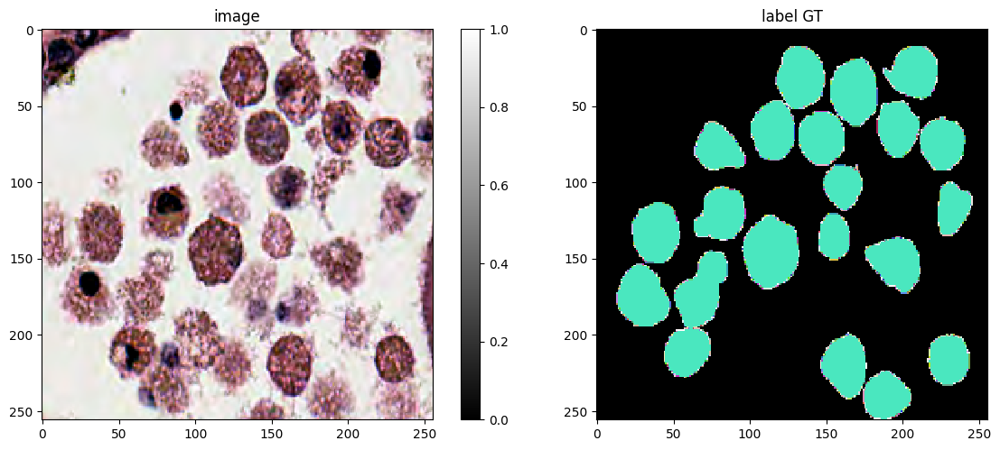

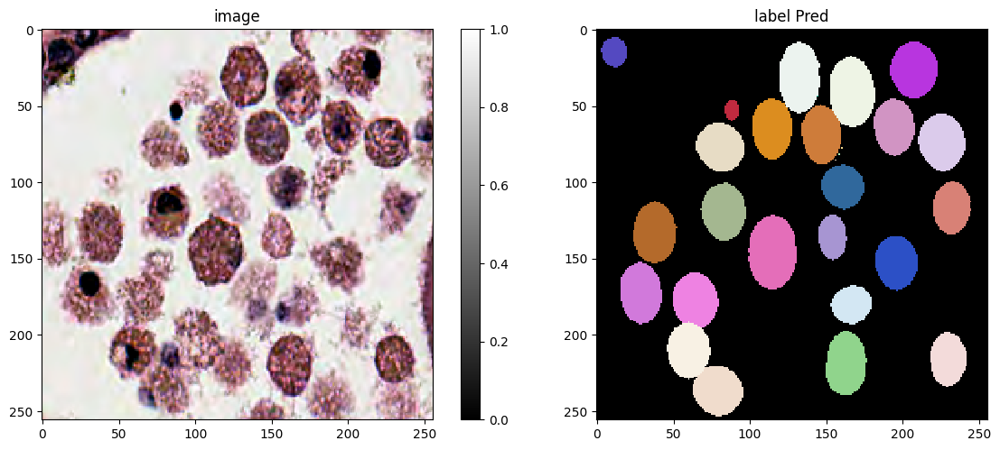

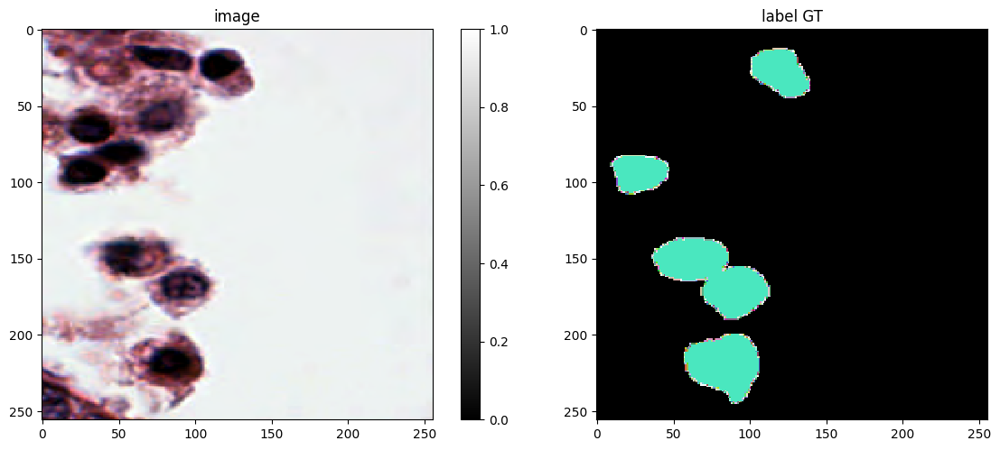

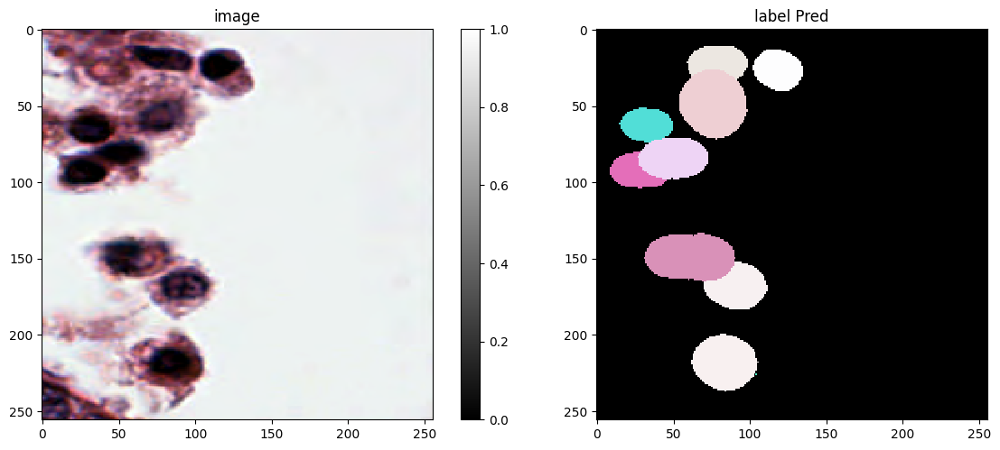

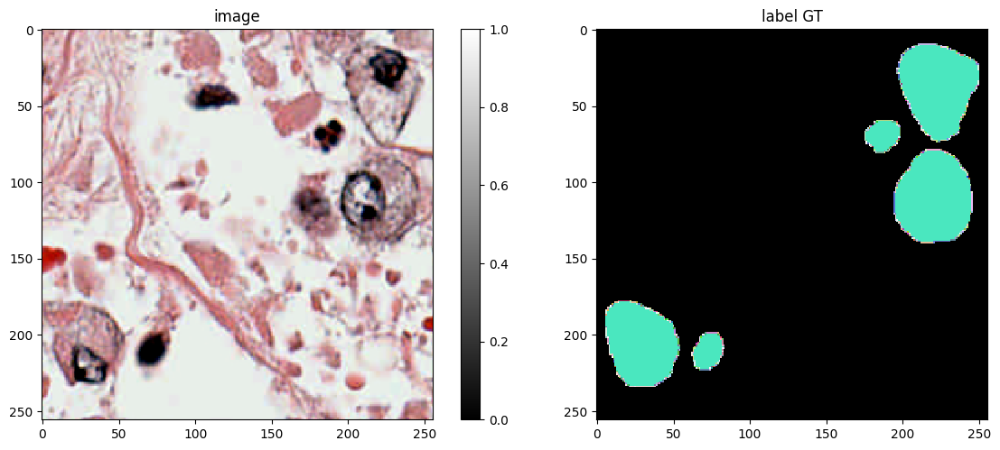

...

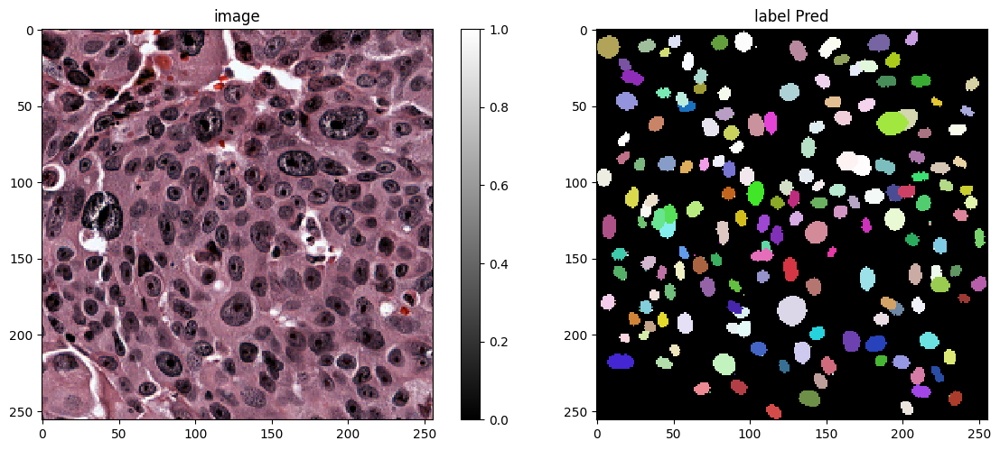

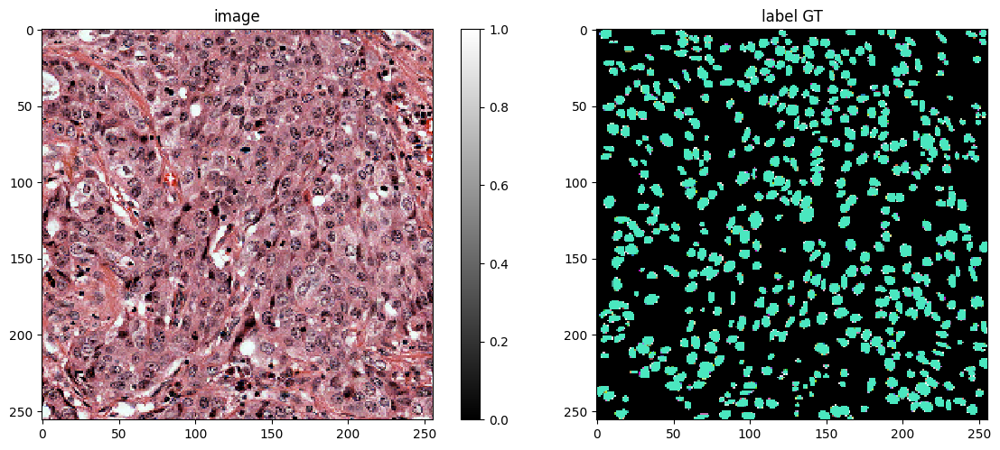

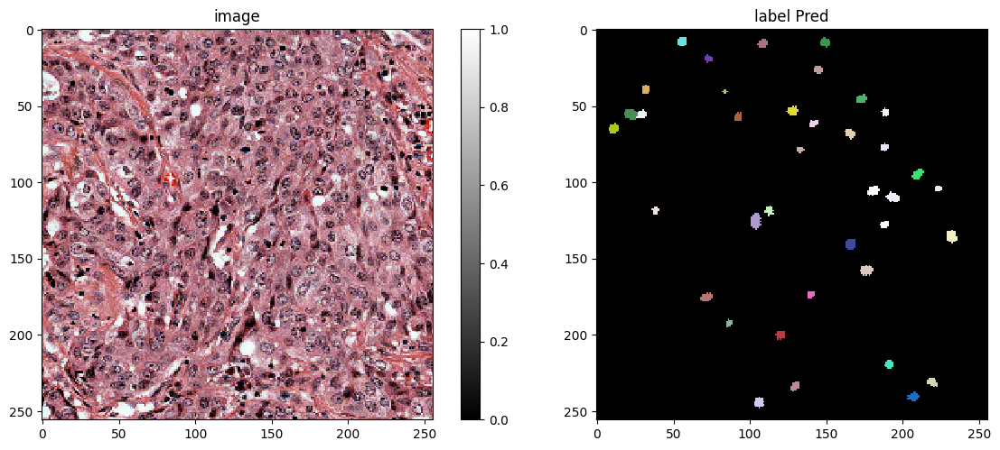

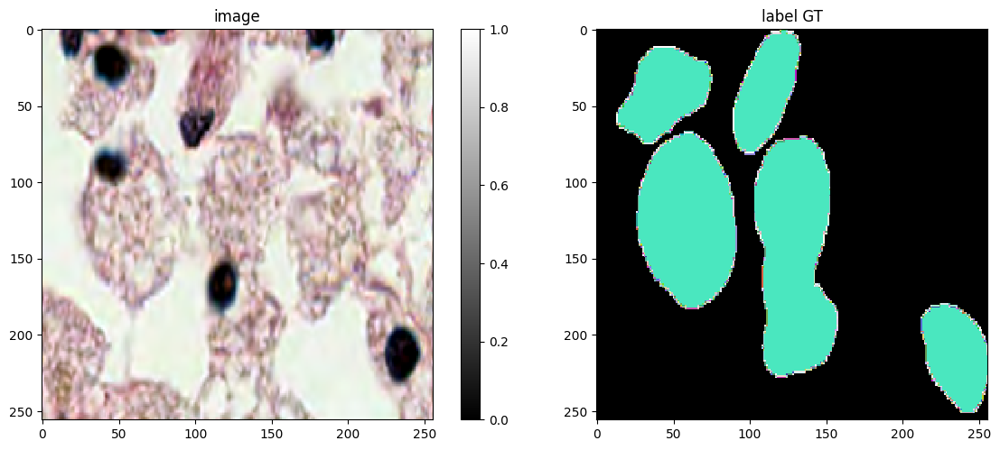

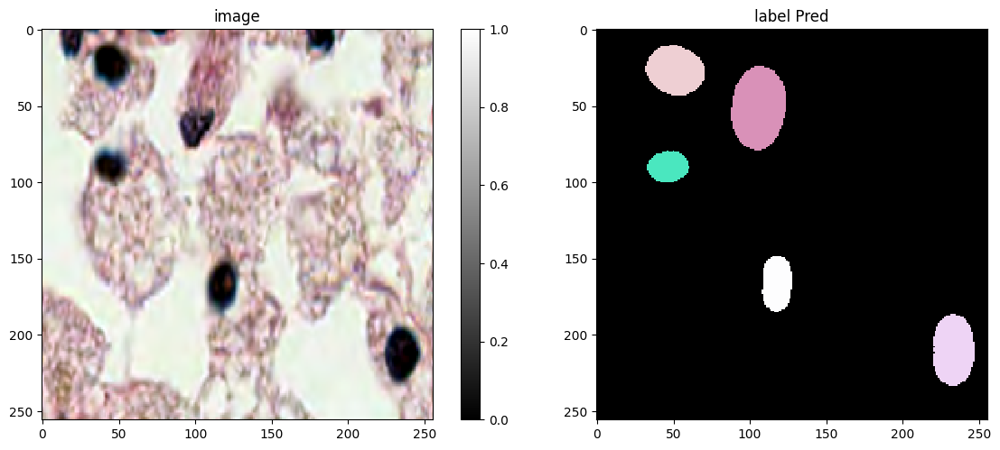

In [25]:
"""for i, image in enumerate(X_trn):
    desired_size = X_trn_image_size[i]
    resized_image = cv2.resize(image, (desired_size[1], desired_size[0]))
    resized_X_trn.append(resized_image)

for i, image in enumerate(Y_trn):
    desired_size = Y_trn_image_size[i]
    resized_image = cv2.resize(image, (desired_size[1], desired_size[0]))
    resized_Y_trn.append(resized_image)

for i, image in enumerate(X_val):
    desired_size = X_val_image_size[i]
    resized_image = cv2.resize(image, (desired_size[1], desired_size[0]))
    resized_X_val.append(resized_image)

for i, image in enumerate(Y_val):
    desired_size = Y_val_image_size[i]
    resized_image = cv2.resize(image, (desired_size[1], desired_size[0]))
    resized_Y_val.append(resized_image)"""
#PLot original labels and predcitions
for i in range(15):

  plot_img_label(X_val_padded[i],Y_val_padded[i], lbl_title="label GT")
  plot_img_label(X_val_padded[i],Y_val_pred[i], lbl_title="label Pred")


taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats = [matching_dataset(Y_val_padded, Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]

stats[taus.index(0.5)]






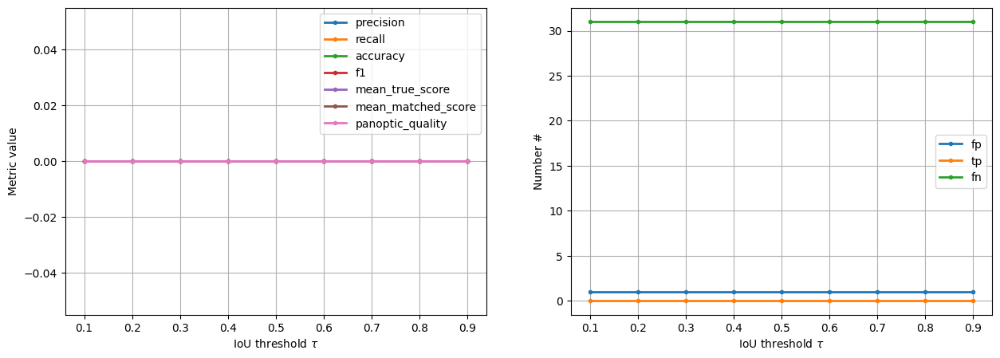

In [25]:
#Plot key metrics
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))

for m in ('precision', 'recall', 'accuracy', 'f1', 'mean_true_score', 'mean_matched_score', 'panoptic_quality'):
    ax1.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax1.set_xlabel(r'IoU threshold $\tau$')
ax1.set_ylabel('Metric value')
ax1.grid()
ax1.legend()

for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax2.set_xlabel(r'IoU threshold $\tau$')
ax2.set_ylabel('Number #')
ax2.grid()
ax2.legend();

